In [2]:
# Importing necessary Libraries 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
#!pip install geopandas contextily shapely
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import contextily as ctx  # For basemap tiles
import warnings
warnings.filterwarnings("ignore")
# ! pip install geodatasets
import geodatasets 
import plotly.express as px
import plotly.graph_objects as go

In [3]:
# Load 2022 and 2023 both datasets
df_2022 = pd.read_excel("2022-uic-injection-volumes.xlsx")
df_2023 = pd.read_excel("2023-uic-injection-volumes-2.xlsx")

In [4]:
# Top 5 rows in each dataset 
print("First 5 rows of 2022 dataset : ", df_2022.head())
print("First 5 rows of 2023 dataset : ", df_2023.head())

First 5 rows of 2022 dataset :            API                   OperatorName  \
0  3503705572       SELLERS JACK B ESTATE OF   
1  3501926223           KODIAK OIL & GAS INC   
2  3507324860     LAGOON WATER LOGISTICS LLC   
3  3501908798        CITATION OIL & GAS CORP   
4  3509900668  HIGHMARK ENERGY OPERATING LLC   

                                       WellName WellNumber Status WellStatus  \
0                                          TARR          2   OPEN         AC   
1                                         BRADY        156   OPEN         AC   
2                         DOVER UNIT HOOVER SWD          1   OPEN         AC   
3  HEALDTON II WATERFLOOD UNIT (FRANKLIN W #23)       V-23   OPEN         AC   
4                     NE DAVIS UNIT (DRAKE-A 3)        9-3   OPEN         AC   

  WellType        LAT        LON      County  ...  Aug Vol Aug PSI Sep Vol  \
0     2DNC  35.898287 -97.557580       CREEK  ...    16622       0   16039   
1     2RIn  34.409956 -97.428979      CART

In [5]:
# information about each dataset 
df_2022.info()
df_2023.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11787 entries, 0 to 11786
Data columns (total 56 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   API                  11787 non-null  int64         
 1   OperatorName         11787 non-null  object        
 2   WellName             11787 non-null  object        
 3   WellNumber           11787 non-null  object        
 4   Status               11787 non-null  object        
 5   WellStatus           11787 non-null  object        
 6   WellType             11786 non-null  object        
 7   LAT                  11780 non-null  float64       
 8   LON                  11780 non-null  float64       
 9   County               11779 non-null  object        
 10  Section              11770 non-null  float64       
 11  Township             11770 non-null  object        
 12  Range                11770 non-null  object        
 13  QTR4                 10991 non-

In [6]:
# Unique Injected fluid types in each dataset
print("Unique injected FluidType from 2022 dataset : ", df_2022['FluidType'].unique())
print("Unique injected FluidType from 2023 dataset : ", df_2023['FluidType'].unique())

Unique injected FluidType from 2022 dataset :  ['SALTWATER' nan 'GAS' 'BRACKISHWATER' 'LPG' 'FRESHWATER']
Unique injected FluidType from 2023 dataset :  ['SALTWATER' 'LPG' 'BRACKISHWATER' nan 'GAS' 'FRESHWATER']


In [7]:
# Filtering only FluidType = SALTWATER from both the datasets
df_2022 = df_2022[df_2022['FluidType'] == 'SALTWATER']
df_2023 = df_2023[df_2023['FluidType'] == 'SALTWATER']

In [8]:
# Count occurrences of each API
api_counts_22 = df_2022["API"].value_counts()
api_counts_23 = df_2023["API"].value_counts()

# Filter APIs that appear more than once
api_more_than_1_22 = api_counts_22[api_counts_22 > 1].index
api_more_than_1_23 = api_counts_23[api_counts_23 > 1].index


# Count of such APIs
print(f"Number of APIs appearing more than once: {len(api_more_than_1_22)}")
print(f"Number of APIs appearing more than once: {len(api_more_than_1_23)}")

# Extract records where API count > 1
df_api_more_than_1_22 = df_2022[df_2022["API"].isin(api_more_than_1_22)]
df_api_more_than_1_23 = df_2023[df_2023["API"].isin(api_more_than_1_23)]

# Save to an Excel file
df_api_more_than_1_22.to_excel("APIs_More_Than_Once_22.xlsx", index=False)
print("File 'APIs_More_Than_Once_22.xlsx' saved successfully!")
df_api_more_than_1_23.to_excel("APIs_More_Than_Once_23.xlsx", index=False)
print("File 'APIs_More_Than_Once_23.xlsx' saved successfully!")

Number of APIs appearing more than once: 922
Number of APIs appearing more than once: 800
File 'APIs_More_Than_Once_22.xlsx' saved successfully!
File 'APIs_More_Than_Once_23.xlsx' saved successfully!


In [9]:
# Identify Vol and PSI columns from datasets 
vol_cols = [col for col in df_2022.columns if "Vol" in col]
psi_cols = [col for col in df_2022.columns if "PSI" in col]
print("Volume Columns :",vol_cols)
print("PSI Columns :", psi_cols)

Volume Columns : ['Jan Vol', 'Feb Vol', 'Mar Vol', 'Apr Vol', 'May Vol', 'Jun Vol', 'Jul Vol', 'Aug Vol', 'Sep Vol', 'Oct Vol', 'Nov Vol', 'Dec Vol']
PSI Columns : ['Jan PSI', 'Feb PSI', 'Mar PSI', 'Apr PSI', 'May PSI', 'Jun PSI', 'Jul PSI', 'Aug PSI', 'Sep PSI', 'Oct PSI', 'Nov PSI', 'Dec PSI']


In [10]:
# List of volume and PSI columns (assuming they contain "Vol" or "PSI" in their names)
vol_psi_cols_22 = [col for col in df_2022.columns if "Vol" in col or "PSI" in col]
vol_psi_cols_23 = [col for col in df_2023.columns if "Vol" in col or "PSI" in col]

# List of columns to retain without aggregation (all except API and vol_psi_cols)
other_cols_22 = [col for col in df_2022.columns if col not in ["API"] + vol_psi_cols_22]
other_cols_23 = [col for col in df_2023.columns if col not in ["API"] + vol_psi_cols_23]

# Group by API, summing volume & PSI columns while retaining the first occurrence of other fields
df_2022_UAPI = df_2022.groupby("API", as_index=False).agg(
    {**{col: "sum" for col in vol_psi_cols_22}, **{col: "first" for col in other_cols_22}}
)
df_2023_UAPI = df_2023.groupby("API", as_index=False).agg(
    {**{col: "sum" for col in vol_psi_cols_23}, **{col: "first" for col in other_cols_23}}
)
# Save the final dataset without duplicate API records
df_2022_UAPI.to_excel("df_2022_UAPI.xlsx", index=False)
df_2023_UAPI.to_excel("df_2023_UAPI.xlsx", index=False)

print("Merged dataset saved as 'df_2022_UAPI.xlsx and df_2023_UAPI.xlsx' successfully!")

Merged dataset saved as 'df_2022_UAPI.xlsx and df_2023_UAPI.xlsx' successfully!


In [11]:
# Count occurrences of each API
api_counts_22_UAPI = df_2022_UAPI["API"].value_counts()
api_counts_23_UAPI = df_2023_UAPI["API"].value_counts()

# Filter APIs that appear more than once
api_more_than_1_22_UAPI = api_counts_22_UAPI[api_counts_22_UAPI > 1].index
api_more_than_1_23_UAPI = api_counts_23_UAPI[api_counts_23_UAPI > 1].index


# Count of such APIs
print(f"Number of APIs appearing more than once: {len(api_more_than_1_22_UAPI)}")
print(f"Number of APIs appearing more than once: {len(api_more_than_1_23_UAPI)}")

# Extract records where API count > 1
df_api_more_than_1_22_UAPI = df_2022_UAPI[df_2022_UAPI["API"].isin(api_more_than_1_22_UAPI)]
df_api_more_than_1_23_UAPI = df_2023_UAPI[df_2023_UAPI["API"].isin(api_more_than_1_23_UAPI)]

# Save to an Excel file
df_api_more_than_1_22_UAPI.to_excel("APIs_More_Than_Once_22_UAPI.xlsx", index=False)
print("File 'APIs_More_Than_Once_22_UAPI.xlsx' saved successfully!")
df_api_more_than_1_23_UAPI.to_excel("APIs_More_Than_Once_23_UAPI.xlsx", index=False)
print("File 'APIs_More_Than_Once_23_UAPI.xlsx' saved successfully!")

Number of APIs appearing more than once: 0
Number of APIs appearing more than once: 0
File 'APIs_More_Than_Once_22_UAPI.xlsx' saved successfully!
File 'APIs_More_Than_Once_23_UAPI.xlsx' saved successfully!


In [12]:
# Count occurrences of each API
api_counts = df_2022_UAPI["API"].value_counts()

# Filter APIs that appear more than once
api_more_than_1 = api_counts[api_counts > 1].index

# Count of such APIs
print(f"Number of APIs appearing more than once: {len(api_more_than_1)}")

# Extract records where API count > 1
df_api_more_than_1_2022 = df_2022_UAPI[df_2022_UAPI["API"].isin(api_more_than_1)]

# Save to an Excel file
df_api_more_than_1_2022.to_excel("APIs_More_Than_Once_2022.xlsx", index=False)
print("File 'APIs_More_Than_Once_2022.xlsx' saved successfully!")

Number of APIs appearing more than once: 0
File 'APIs_More_Than_Once_2022.xlsx' saved successfully!


In [13]:
df_2022 = df_2022_UAPI
df_2023 = df_2023_UAPI

In [14]:
# Dropping the unwanted columns from the dataframe df_2022
df_2022.drop(columns=['OperatorName', 'WellName','WellNumber','WellType','WellStatus','Section','Township','Range','QTR4','QTR3','QTR2','QTR1','LastMITDate','CommissionOrderNo','ReportYear','ModifyDate','ProdReportType','PM'], inplace=True)
# Dropping the unwanted columns from the dataframe df_2023
df_2023.drop(columns=['OperatorName', 'WellName','WellNumber','WellType','WellStatus','Section','Township','Range','QTR4','QTR3','QTR2','QTR1','LastMITDate','CommissionOrderNo','ReportYear','ModifyDate','ProdReportType','PM'], inplace=True)

In [15]:
# Rename Volume & PSI columns by appending year for 2022 and 2023 
df_2022 = df_2022.rename(columns={col: col + " 2022" for col in vol_cols + psi_cols})
df_2023 = df_2023.rename(columns={col: col + " 2023" for col in vol_cols + psi_cols})

In [16]:
df_2022.head()

,API,Jan Vol 2022,Jan PSI 2022,Feb Vol 2022,Feb PSI 2022,Mar Vol 2022,Mar PSI 2022,Apr Vol 2022,Apr PSI 2022,May Vol 2022,...,County,TotalDepth,PlugBackTotalDepth,PermitFormationName,InjTopDepth,InjBotDepth,MeasurementType,FluidType,Packer,PackerDepth
0,3500300163,900,175,900,175,900,175,900,175,900,...,ALFALFA,5060.0,4950.0,None,4984.0,4994.0,CALCULATED,SALTWATER,YES,4933.0
1,3500321074,0,0,0,0,0,0,0,0,0,...,ALFALFA,5932.0,4900.0,RED FORK,4958.0,4972.0,METERED,SALTWATER,NO,NaN
2,3500321107,1050,175,1050,175,1050,175,1080,175,1080,...,ALFALFA,4986.0,4900.0,None,4930.0,4941.0,CALCULATED,SALTWATER,YES,4881.0
3,3500321242,30,90,30,90,30,90,30,90,30,...,ALFALFA,6203.0,5998.0,RED FORK,6057.0,6066.0,CALCULATED,SALTWATER,NO,NaN
4,3500321328,70,650,40,650,250,650,280,650,240,...,ALFALFA,7322.0,3010.0,PERMIAN,2560.0,2610.0,METERED,SALTWATER,YES,5127.0


In [17]:
# Unique PermitFormationName from 2022 dataset
permitformation_counts_2022 = df_2022["PermitFormationName"].value_counts()
print(permitformation_counts_2022)

PermitFormationName
DEESE                                  681
BARTLESVILLE                           567
ARBUCKLE                               399
PERMIAN                                308
HEALDTON                               253
                                      ... 
BELVEAL|CAMPBELL|HOTSON|NEWKIRK          1
BIG LIME-OSWEGO|MISSISSIPPIAN SOLID      1
1ST WILCOX|LAYTON|OSAGE                  1
ARBUCKLE DOLOMITE|GRANITE                1
ENDICOTT|HUNTON,WILCOX|TONKAWA           1
Name: count, Length: 945, dtype: int64


In [18]:
# Get unique PermitFormationNames
unique_permitformations = df_2022["PermitFormationName"].dropna().unique()

# Convert to DataFrame
permitformations_df = pd.DataFrame(unique_permitformations, columns=["PermitFormationName"])

# Export to Excel
permitformations_df.to_excel("PermitFormationNames_2022.xlsx", index=False)

print("Excel file saved successfully!")

Excel file saved successfully!


In [19]:
# Replacing null values with Others
df_2022["PermitFormationName"] = df_2022["PermitFormationName"].fillna("Others")

In [20]:
# Unique County from 2022 dataset
County_counts_2022 = df_2022["County"].value_counts()
print(County_counts_2022)

County
CARTER       1820
STEPHENS     1272
CREEK         868
PONTOTOC      663
SEMINOLE      393
             ... 
CRAIG           2
GREER           2
BRYAN           1
HARMON          1
STATEWIDE       1
Name: count, Length: 67, dtype: int64


In [21]:
# Get the top 3 counties based on occurrence count
top_3_counties = df_2022["County"].value_counts().nlargest(3).index  

# Replace counties that are not in the top 3 with "Others"
df_2022["County"] = df_2022["County"].apply(lambda x: x if x in top_3_counties else "Others")

In [22]:
df_2022["County"].value_counts()

County
Others      5944
CARTER      1820
STEPHENS    1272
CREEK        868
Name: count, dtype: int64

In [23]:
# Appending 2023 for Vol and PSI columns with 2023 

In [24]:
# vol_cols = [col for col in df_2022.columns if "Vol" in col and "2022" in col]
# psi_cols = [col for col in df_2022.columns if "PSI" in col and "2022" in col]

In [25]:
# psi_cols

In [26]:
# Identify other columns (excluding API, LAT, LON, and correctly identified Vol/PSI columns)
categorical_cols = [col for col in df_2022.columns if col not in ["API"] + vol_cols + psi_cols]

print("Categorical Columns:", categorical_cols)

Categorical Columns: ['Jan Vol 2022', 'Jan PSI 2022', 'Feb Vol 2022', 'Feb PSI 2022', 'Mar Vol 2022', 'Mar PSI 2022', 'Apr Vol 2022', 'Apr PSI 2022', 'May Vol 2022', 'May PSI 2022', 'Jun Vol 2022', 'Jun PSI 2022', 'Jul Vol 2022', 'Jul PSI 2022', 'Aug Vol 2022', 'Aug PSI 2022', 'Sep Vol 2022', 'Sep PSI 2022', 'Oct Vol 2022', 'Oct PSI 2022', 'Nov Vol 2022', 'Nov PSI 2022', 'Dec Vol 2022', 'Dec PSI 2022', 'Status', 'LAT', 'LON', 'County', 'TotalDepth', 'PlugBackTotalDepth', 'PermitFormationName', 'InjTopDepth', 'InjBotDepth', 'MeasurementType', 'FluidType', 'Packer', 'PackerDepth']


In [27]:
df_2023.head()

,API,Jan Vol 2023,Jan PSI 2023,Feb Vol 2023,Feb PSI 2023,Mar Vol 2023,Mar PSI 2023,Apr Vol 2023,Apr PSI 2023,May Vol 2023,...,County,TotalDepth,PlugBackTotalDepth,PermitFormationName,InjTopDepth,InjBotDepth,MeasurementType,FluidType,Packer,PackerDepth
0,3500300163,0,0,0,0,0,0,0,0,0,...,ALFALFA,5060.0,4950.0,None,4984.0,4994.0,CALCULATED,SALTWATER,YES,4933.0
1,3500321107,1050,175,1050,175,1050,175,175,175,1080,...,ALFALFA,4986.0,4900.0,None,4930.0,4941.0,CALCULATED,SALTWATER,YES,4881.0
2,3500321242,30,90,30,90,30,90,30,90,30,...,ALFALFA,6203.0,5998.0,RED FORK,6057.0,6066.0,CALCULATED,SALTWATER,NO,NaN
3,3500321328,230,650,180,650,250,650,240,650,380,...,ALFALFA,7322.0,3010.0,PERMIAN,2560.0,2610.0,METERED,SALTWATER,YES,5127.0
4,3500321404,45,90,45,90,45,90,45,90,45,...,ALFALFA,6312.0,6262.0,RED FORK,6015.0,6034.0,CALCULATED,SALTWATER,YES,5950.0


In [28]:
# Unique PermitFormationName from 2023 dataset
permitformation_counts_2023 = df_2023["PermitFormationName"].value_counts()
print(permitformation_counts_2023)

PermitFormationName
DEESE                                               661
BARTLESVILLE                                        492
ARBUCKLE                                            387
PERMIAN                                             298
HEALDTON                                            251
                                                   ... 
PAWHUSKA,HOOVER,ELGIN,OREAD,TONKAWA|PERMIAN SAND      1
VIRGILIAN|WOLFCAMP                                    1
WABAUNSEE-SHAWNEE|WOLFCAMPIAN                         1
DUNCAN SAND                                           1
ENDICOTT|HUNTON,WILCOX|TONKAWA                        1
Name: count, Length: 947, dtype: int64


In [29]:
# Get unique PermitFormationNames
unique_permitformations = df_2023["PermitFormationName"].dropna().unique()

# Convert to DataFrame
permitformations_df = pd.DataFrame(unique_permitformations, columns=["PermitFormationName"])

# Export to Excel
permitformations_df.to_excel("PermitFormationNames_2023.xlsx", index=False)

print("Excel for PermitFormationNames_2023 file saved successfully!")

Excel for PermitFormationNames_2023 file saved successfully!


In [30]:
# Replacing null values with Others in PermitFormationName
df_2023["PermitFormationName"] = df_2023["PermitFormationName"].fillna("Others")

In [31]:
# Unique County from 2023 dataset
County_counts_2023 = df_2023["County"].value_counts()
print(County_counts_2023)

County
CARTER       1826
STEPHENS     1229
CREEK         856
PONTOTOC      641
SEMINOLE      391
             ... 
LATIMER         4
CRAIG           3
LEFLORE         3
GREER           2
STATEWIDE       1
Name: count, Length: 66, dtype: int64


In [32]:
# Get the top 3 counties based on occurrence count for 2023
top_3_counties_2023 = df_2023["County"].value_counts().nlargest(3).index  

# Replace counties that are not in the top 3 with "Others"
df_2023["County"] = df_2023["County"].apply(lambda x: x if x in top_3_counties_2023 else "Others")

In [33]:
vol_cols = [col for col in df_2023.columns if "Vol" in col and "2023" in col]
psi_cols = [col for col in df_2023.columns if "PSI" in col and "2023" in col]

In [34]:
# Identify other columns (excluding API, LAT, LON, and correctly identified Vol/PSI columns)
categorical_cols = [col for col in df_2023.columns if col not in ["API"] + vol_cols + psi_cols]
print("Categorical Columns:", categorical_cols)

Categorical Columns: ['Status', 'LAT', 'LON', 'County', 'TotalDepth', 'PlugBackTotalDepth', 'PermitFormationName', 'InjTopDepth', 'InjBotDepth', 'MeasurementType', 'FluidType', 'Packer', 'PackerDepth']


In [35]:
# -------- ## Left Outer Join using API only ###----------

In [36]:
df_left = pd.merge(df_2022, df_2023, on=["API"], how="left", suffixes=('_2022', '_2023'))

# Keep remaining columns from one dataset
for col in categorical_cols:
    df_left[col] = df_left[col + "_2022"].fillna(df_left[col + "_2023"])
    df_left.drop(columns=[col + "_2022", col + "_2023"], inplace=True)

# Save to Excel
df_left.to_excel("df_left.xlsx", index=False)
print("Excel file 'df_left.xlsx' saved successfully!")

Excel file 'df_left.xlsx' saved successfully!


In [37]:
df_left.shape

(9904, 62)

In [38]:
# -------- ## Right Outer Join using API only ###----------

In [39]:
df_right = pd.merge(df_2022, df_2023, on=["API"], how="right", suffixes=('_2022', '_2023'))

# Keep remaining columns from one dataset
for col in categorical_cols:
    df_right[col] = df_right[col + "_2022"].fillna(df_right[col + "_2023"])
    df_right.drop(columns=[col + "_2022", col + "_2023"], inplace=True)

# Save to Excel
df_right.to_excel("df_right.xlsx", index=False)
print("Excel file 'df_right.xlsx' saved successfully!")

Excel file 'df_right.xlsx' saved successfully!


In [40]:
df_right.shape

(9582, 62)

In [41]:
# -------- ## Full Outer Join using API only ###----------

In [42]:
# Perform full outer join on 'API' column
df_full_outer = pd.merge(df_2022, df_2023, on=["API"], how="outer", suffixes=('_2022', '_2023'))

# Keep remaining columns from one dataset for categorical columns
for col in categorical_cols:
    df_full_outer[col] = df_full_outer[col + "_2022"].fillna(df_full_outer[col + "_2023"])
    df_full_outer.drop(columns=[col + "_2022", col + "_2023"], inplace=True)

# Save to Excel
df_full_outer.shape
df_full_outer.to_excel("df_full_outer.xlsx", index=False)
print("Excel file 'df_full_outer.xlsx' saved successfully!")

Excel file 'df_full_outer.xlsx' saved successfully!


In [43]:
# -------- ## API only available in 2022 and 2023 datasets ###----------

In [44]:
import pandas as pd

# Get unique API lists
api_2022 = set(df_2022["API"])
api_2023 = set(df_2023["API"])

# APIs in 2022 but not in 2023
api_only_2022 = api_2022 - api_2023
df_api_only_2022 = df_2022[df_2022["API"].isin(api_only_2022)]

# APIs in 2023 but not in 2022
api_only_2023 = api_2023 - api_2022
df_api_only_2023 = df_2023[df_2023["API"].isin(api_only_2023)]

# Save to Excel
df_api_only_2022.to_excel("APIs_Only_in_2022.xlsx", index=False)
print("Excel file 'APIs_Only_in_2022.xlsx' saved successfully!")

df_api_only_2023.to_excel("APIs_Only_in_2023.xlsx", index=False)
print("Excel file 'APIs_Only_in_2023.xlsx' saved successfully!")

Excel file 'APIs_Only_in_2022.xlsx' saved successfully!
Excel file 'APIs_Only_in_2023.xlsx' saved successfully!


In [45]:
# -------- ## Inner Join using API only ###----------

In [46]:
# Merge datasets using INNER JOIN (to keep only matching wells)
df_final = pd.merge(df_2022, df_2023, on=["API"], how="inner", suffixes=('_2022', '_2023'))

In [47]:
# Keep remaining columns from one dataset
for col in categorical_cols:
    df_final[col] = df_final[col + "_2022"].fillna(df_final[col + "_2023"])
    df_final.drop(columns=[col + "_2022", col + "_2023"], inplace=True)

In [48]:
df_final = df_full_outer

In [49]:
df_final.shape

(10129, 62)

In [50]:
df_final.head()

,API,Jan Vol 2022,Jan PSI 2022,Feb Vol 2022,Feb PSI 2022,Mar Vol 2022,Mar PSI 2022,Apr Vol 2022,Apr PSI 2022,May Vol 2022,...,County,TotalDepth,PlugBackTotalDepth,PermitFormationName,InjTopDepth,InjBotDepth,MeasurementType,FluidType,Packer,PackerDepth
0,3500300163,900.0,175.0,900.0,175.0,900.0,175.0,900.0,175.0,900.0,...,Others,5060.0,4950.0,Others,4984.0,4994.0,CALCULATED,SALTWATER,YES,4933.0
1,3500321074,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Others,5932.0,4900.0,RED FORK,4958.0,4972.0,METERED,SALTWATER,NO,NaN
2,3500321107,1050.0,175.0,1050.0,175.0,1050.0,175.0,1080.0,175.0,1080.0,...,Others,4986.0,4900.0,Others,4930.0,4941.0,CALCULATED,SALTWATER,YES,4881.0
3,3500321242,30.0,90.0,30.0,90.0,30.0,90.0,30.0,90.0,30.0,...,Others,6203.0,5998.0,RED FORK,6057.0,6066.0,CALCULATED,SALTWATER,NO,NaN
4,3500321328,70.0,650.0,40.0,650.0,250.0,650.0,280.0,650.0,240.0,...,Others,7322.0,3010.0,PERMIAN,2560.0,2610.0,METERED,SALTWATER,YES,5127.0


In [51]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10129 entries, 0 to 10128
Data columns (total 62 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   API                  10129 non-null  int64  
 1   Jan Vol 2022         9904 non-null   float64
 2   Jan PSI 2022         9904 non-null   float64
 3   Feb Vol 2022         9904 non-null   float64
 4   Feb PSI 2022         9904 non-null   float64
 5   Mar Vol 2022         9904 non-null   float64
 6   Mar PSI 2022         9904 non-null   float64
 7   Apr Vol 2022         9904 non-null   float64
 8   Apr PSI 2022         9904 non-null   float64
 9   May Vol 2022         9904 non-null   float64
 10  May PSI 2022         9904 non-null   float64
 11  Jun Vol 2022         9904 non-null   float64
 12  Jun PSI 2022         9904 non-null   float64
 13  Jul Vol 2022         9904 non-null   float64
 14  Jul PSI 2022         9904 non-null   float64
 15  Aug Vol 2022         9904 non-null  

In [52]:
df_final_categorical_cols=['LAT','LON','Status','TotalDepth','PlugBackTotalDepth','InjTopDepth','InjBotDepth','MeasurementType','FluidType','Packer','PackerDepth','PermitFormationName','County']

In [53]:
df_final_Uniquekey=['API']

In [54]:
# Identify numerical columns by excluding categorical and unique key columns
df_final_numerical_cols = [col for col in df_final.columns if col not in df_final_categorical_cols + df_final_Uniquekey]

# Print numerical columns
print(df_final_numerical_cols)

['Jan Vol 2022', 'Jan PSI 2022', 'Feb Vol 2022', 'Feb PSI 2022', 'Mar Vol 2022', 'Mar PSI 2022', 'Apr Vol 2022', 'Apr PSI 2022', 'May Vol 2022', 'May PSI 2022', 'Jun Vol 2022', 'Jun PSI 2022', 'Jul Vol 2022', 'Jul PSI 2022', 'Aug Vol 2022', 'Aug PSI 2022', 'Sep Vol 2022', 'Sep PSI 2022', 'Oct Vol 2022', 'Oct PSI 2022', 'Nov Vol 2022', 'Nov PSI 2022', 'Dec Vol 2022', 'Dec PSI 2022', 'Jan Vol 2023', 'Jan PSI 2023', 'Feb Vol 2023', 'Feb PSI 2023', 'Mar Vol 2023', 'Mar PSI 2023', 'Apr Vol 2023', 'Apr PSI 2023', 'May Vol 2023', 'May PSI 2023', 'Jun Vol 2023', 'Jun PSI 2023', 'Jul Vol 2023', 'Jul PSI 2023', 'Aug Vol 2023', 'Aug PSI 2023', 'Sep Vol 2023', 'Sep PSI 2023', 'Oct Vol 2023', 'Oct PSI 2023', 'Nov Vol 2023', 'Nov PSI 2023', 'Dec Vol 2023', 'Dec PSI 2023']


In [55]:
# Define the desired column order
ordered_columns = df_final_Uniquekey + df_final_categorical_cols + df_final_numerical_cols

# Reorder the final dataframe
df_final = df_final[ordered_columns]

df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10129 entries, 0 to 10128
Data columns (total 62 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   API                  10129 non-null  int64  
 1   LAT                  10125 non-null  float64
 2   LON                  10125 non-null  float64
 3   Status               10129 non-null  object 
 4   TotalDepth           9880 non-null   float64
 5   PlugBackTotalDepth   9864 non-null   float64
 6   InjTopDepth          7140 non-null   float64
 7   InjBotDepth          7140 non-null   float64
 8   MeasurementType      10129 non-null  object 
 9   FluidType            10129 non-null  object 
 10  Packer               10129 non-null  object 
 11  PackerDepth          9677 non-null   float64
 12  PermitFormationName  10129 non-null  object 
 13  County               10129 non-null  object 
 14  Jan Vol 2022         9904 non-null   float64
 15  Jan PSI 2022         9904 non-null  

In [56]:
# Save to CSV
df_final.to_csv("UIC_df_final.csv", index=False)

In [57]:
df_final

,API,LAT,LON,Status,TotalDepth,PlugBackTotalDepth,InjTopDepth,InjBotDepth,MeasurementType,FluidType,...,Aug Vol 2023,Aug PSI 2023,Sep Vol 2023,Sep PSI 2023,Oct Vol 2023,Oct PSI 2023,Nov Vol 2023,Nov PSI 2023,Dec Vol 2023,Dec PSI 2023
0,3500300163,36.896458,-98.179582,OPEN,5060.0,4950.0,4984.0,4994.0,CALCULATED,SALTWATER,...,900.0,175.0,900.0,175.0,900.0,175.0,900.0,175.0,900.0,175.0
1,3500321074,36.888738,-98.319802,OPEN,5932.0,4900.0,4958.0,4972.0,METERED,SALTWATER,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3500321107,36.892139,-98.196351,OPEN,4986.0,4900.0,4930.0,4941.0,CALCULATED,SALTWATER,...,1050.0,175.0,1050.0,175.0,1050.0,175.0,1050.0,175.0,1050.0,175.0
3,3500321242,36.592341,-98.463515,OPEN,6203.0,5998.0,6057.0,6066.0,CALCULATED,SALTWATER,...,30.0,90.0,30.0,90.0,30.0,90.0,30.0,90.0,30.0,90.0
4,3500321328,36.674104,-98.515650,OPEN,7322.0,3010.0,2560.0,2610.0,METERED,SALTWATER,...,370.0,650.0,380.0,650.0,280.0,650.0,270.0,650.0,20.0,650.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10124,3515323351,36.255345,-99.553130,OPEN,7700.0,7500.0,NaN,NaN,METERED,SALTWATER,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10125,3515323352,36.262596,-99.557610,OPEN,7700.0,7500.0,NaN,NaN,METERED,SALTWATER,...,8746.0,1800.0,2560.0,1700.0,2874.0,1800.0,1602.0,1700.0,890.0,1500.0
10126,3515323353,36.262634,-99.548620,OPEN,7700.0,7500.0,NaN,NaN,METERED,SALTWATER,...,2507.0,1600.0,2564.0,1700.0,3184.0,1800.0,1546.0,1700.0,881.0,1500.0
10127,3515323507,36.436970,-99.137600,OPEN,6500.0,6500.0,5890.0,6424.0,METERED,SALTWATER,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [58]:
# Compute total injected volume and count of months where injection > 0
df_final["Total_Volume"] = df_final[df_final_numerical_cols].filter(like="Vol").sum(axis=1)
df_final["Total_PSI"] = df_final[df_final_numerical_cols].filter(like="PSI").sum(axis=1)

# Count the number of months where volume > 0 for each row
df_final["Active_Months"] = df_final[df_final_numerical_cols].filter(like="Vol").gt(0).sum(axis=1)

# Calculate average volume and PSI (avoiding division by zero)
df_final["Avg_Volume"] = df_final["Total_Volume"] / df_final["Active_Months"]
df_final["Avg_PSI"] = df_final["Total_PSI"] / df_final["Active_Months"]

# Replace NaN values (if a well had 0 active months)
df_final["Avg_Volume"].fillna(0, inplace=True)
df_final["Avg_PSI"].fillna(0, inplace=True)

# Display the final dataframe with new computed columns
print(df_final[["API","Total_Volume", "Avg_Volume", "Total_PSI", "Avg_PSI"]].head())

          API  Total_Volume   Avg_Volume  Total_PSI  Avg_PSI
0  3500300163       16200.0   900.000000     3150.0    175.0
1  3500321074           0.0     0.000000        0.0      0.0
2  3500321107       24445.0  1018.541667     4200.0    175.0
3  3500321242         720.0    30.000000     2160.0     90.0
4  3500321328        5840.0   243.333333    15600.0    650.0


In [59]:
# Displaying the final dataframe 
df_final
file_name = "df_final.xlsx"
df_final.to_excel(file_name, index=False)

In [60]:
# Define columns to check for outliers
columns = ["Avg_Volume"]

# Compute IQR (Interquartile Range) for each column
Q1 = df_final[columns].quantile(0.25)
Q3 = df_final[columns].quantile(0.75)
IQR = Q3 - Q1

# Define the outlier bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify rows where any column has an outlier
outlier_mask = (df_final[columns] < lower_bound) | (df_final[columns] > upper_bound)

# Select entire rows where at least one outlier exists
outliers_df_final = df_final[outlier_mask.any(axis=1)]  

# Save to an Excel file
outliers_df_final.to_excel("outliers_1_vol.xlsx", index=False)

print("Outliers saved to 'outliers_1_vol.xlsx'")

# Count outliers for each column
outlier_counts = outlier_mask.sum()

# Print outlier counts
print("Outlier counts per column:")
print(outlier_counts)

Outliers saved to 'outliers_1_vol.xlsx'
Outlier counts per column:
Avg_Volume    907
dtype: int64


In [61]:
# Define columns to check for outliers
columns = ["Avg_PSI"]

# Compute IQR (Interquartile Range) for each column
Q1 = df_final[columns].quantile(0.25)
Q3 = df_final[columns].quantile(0.75)
IQR = Q3 - Q1

# Define the outlier bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify rows where any column has an outlier
outlier_mask = (df_final[columns] < lower_bound) | (df_final[columns] > upper_bound)

# Select entire rows where at least one outlier exists
outliers_df_final = df_final[outlier_mask.any(axis=1)]  

# Save to an Excel file
outliers_df_final.to_excel("outliers_1_PSI.xlsx", index=False)

print("Outliers saved to 'outliers_1_df_PSI.xlsx'")

# Count outliers for each column
outlier_counts = outlier_mask.sum()

# Print outlier counts
print("Outlier counts per column:")
print(outlier_counts)

Outliers saved to 'outliers_1_df_PSI.xlsx'
Outlier counts per column:
Avg_PSI    773
dtype: int64


In [62]:
# Dropping indidual month Vol and PSI columns, Total Volume, Total PSI, Active_months from df_final
df_final.drop(columns=df_final_numerical_cols + ["Active_Months", "Total_PSI"], inplace=True)

In [63]:
# After removing each month Vol, PSI, Total_PSI and Active Months columns from df_final
df_final

,API,LAT,LON,Status,TotalDepth,PlugBackTotalDepth,InjTopDepth,InjBotDepth,MeasurementType,FluidType,Packer,PackerDepth,PermitFormationName,County,Total_Volume,Avg_Volume,Avg_PSI
0,3500300163,36.896458,-98.179582,OPEN,5060.0,4950.0,4984.0,4994.0,CALCULATED,SALTWATER,YES,4933.0,Others,Others,16200.0,900.000000,175.000000
1,3500321074,36.888738,-98.319802,OPEN,5932.0,4900.0,4958.0,4972.0,METERED,SALTWATER,NO,NaN,RED FORK,Others,0.0,0.000000,0.000000
2,3500321107,36.892139,-98.196351,OPEN,4986.0,4900.0,4930.0,4941.0,CALCULATED,SALTWATER,YES,4881.0,Others,Others,24445.0,1018.541667,175.000000
3,3500321242,36.592341,-98.463515,OPEN,6203.0,5998.0,6057.0,6066.0,CALCULATED,SALTWATER,NO,NaN,RED FORK,Others,720.0,30.000000,90.000000
4,3500321328,36.674104,-98.515650,OPEN,7322.0,3010.0,2560.0,2610.0,METERED,SALTWATER,YES,5127.0,PERMIAN,Others,5840.0,243.333333,650.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10124,3515323351,36.255345,-99.553130,OPEN,7700.0,7500.0,NaN,NaN,METERED,SALTWATER,YES,7475.0,Others,Others,67004.0,8375.500000,2231.250000
10125,3515323352,36.262596,-99.557610,OPEN,7700.0,7500.0,NaN,NaN,METERED,SALTWATER,YES,7489.0,Others,Others,101001.0,4590.954545,1800.000000
10126,3515323353,36.262634,-99.548620,OPEN,7700.0,7500.0,NaN,NaN,METERED,SALTWATER,YES,7497.0,Others,Others,76602.0,3330.521739,1430.434783
10127,3515323507,36.436970,-99.137600,OPEN,6500.0,6500.0,5890.0,6424.0,METERED,SALTWATER,YES,5865.0,Others,Others,0.0,0.000000,0.000000


In [64]:
df=df_final
df

,API,LAT,LON,Status,TotalDepth,PlugBackTotalDepth,InjTopDepth,InjBotDepth,MeasurementType,FluidType,Packer,PackerDepth,PermitFormationName,County,Total_Volume,Avg_Volume,Avg_PSI
0,3500300163,36.896458,-98.179582,OPEN,5060.0,4950.0,4984.0,4994.0,CALCULATED,SALTWATER,YES,4933.0,Others,Others,16200.0,900.000000,175.000000
1,3500321074,36.888738,-98.319802,OPEN,5932.0,4900.0,4958.0,4972.0,METERED,SALTWATER,NO,NaN,RED FORK,Others,0.0,0.000000,0.000000
2,3500321107,36.892139,-98.196351,OPEN,4986.0,4900.0,4930.0,4941.0,CALCULATED,SALTWATER,YES,4881.0,Others,Others,24445.0,1018.541667,175.000000
3,3500321242,36.592341,-98.463515,OPEN,6203.0,5998.0,6057.0,6066.0,CALCULATED,SALTWATER,NO,NaN,RED FORK,Others,720.0,30.000000,90.000000
4,3500321328,36.674104,-98.515650,OPEN,7322.0,3010.0,2560.0,2610.0,METERED,SALTWATER,YES,5127.0,PERMIAN,Others,5840.0,243.333333,650.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10124,3515323351,36.255345,-99.553130,OPEN,7700.0,7500.0,NaN,NaN,METERED,SALTWATER,YES,7475.0,Others,Others,67004.0,8375.500000,2231.250000
10125,3515323352,36.262596,-99.557610,OPEN,7700.0,7500.0,NaN,NaN,METERED,SALTWATER,YES,7489.0,Others,Others,101001.0,4590.954545,1800.000000
10126,3515323353,36.262634,-99.548620,OPEN,7700.0,7500.0,NaN,NaN,METERED,SALTWATER,YES,7497.0,Others,Others,76602.0,3330.521739,1430.434783
10127,3515323507,36.436970,-99.137600,OPEN,6500.0,6500.0,5890.0,6424.0,METERED,SALTWATER,YES,5865.0,Others,Others,0.0,0.000000,0.000000


In [65]:
df.shape

(10129, 17)

In [66]:
# Display the column names 
df.columns 

Index(['API', 'LAT', 'LON', 'Status', 'TotalDepth', 'PlugBackTotalDepth',
       'InjTopDepth', 'InjBotDepth', 'MeasurementType', 'FluidType', 'Packer',
       'PackerDepth', 'PermitFormationName', 'County', 'Total_Volume',
       'Avg_Volume', 'Avg_PSI'],
      dtype='object')

In [67]:
# Calculate the total number of missing (NaN) values in each column of the DataFrame.
missing_values = df.isnull().sum()
missing_values = missing_values[missing_values > 0]
print(missing_values)

LAT                      4
LON                      4
TotalDepth             249
PlugBackTotalDepth     265
InjTopDepth           2989
InjBotDepth           2989
PackerDepth            452
dtype: int64


In [68]:
# Deleting the rows with null in all the columns where we have missing values
df=df.dropna(subset=["LAT","LON","TotalDepth", "PlugBackTotalDepth", "InjTopDepth", "InjBotDepth", "PackerDepth"])

In [69]:
df.shape

(6724, 17)

In [70]:
# Calculate the total number of missing (NaN) values in each column of the DataFrame.
missing_values = df.isnull().sum()
missing_values = missing_values[missing_values > 0]
# Calculate IQR for Latitude and Longitude
Q1_LAT = df['LAT'].quantile(0.25)
Q3_LAT = df['LAT'].quantile(0.75)
IQR_LAT = Q3_LAT - Q1_LAT

Q1_LON = df['LON'].quantile(0.25)
Q3_LON = df['LON'].quantile(0.75)
IQR_LON = Q3_LON - Q1_LON

# Define the outlier boundaries
LAT_lower = Q1_LAT - 1.5 * IQR_LAT
LAT_upper = Q3_LAT + 1.5 * IQR_LAT

LON_lower = Q1_LON - 1.5 * IQR_LON
LON_upper = Q3_LON + 1.5 * IQR_LON

# Detect outliers based on these boundaries
outliers_LAT = (df['LAT'] < LAT_lower) | (df['LAT'] > LAT_upper)
outliers_LON = (df['LON'] < LON_lower) | (df['LON'] > LON_upper)

# Combine outlier conditions
outliers = outliers_LAT | outliers_LON 
print(missing_values)

Series([], dtype: int64)


In [71]:
# Calculate IQR for Latitude and Longitude
Q1_LAT = df['LAT'].quantile(0.25)
Q3_LAT = df['LAT'].quantile(0.75)
IQR_LAT = Q3_LAT - Q1_LAT

Q1_LON = df['LON'].quantile(0.25)
Q3_LON = df['LON'].quantile(0.75)
IQR_LON = Q3_LON - Q1_LON

# Define the outlier boundaries
LAT_lower = Q1_LAT - 1.5 * IQR_LAT
LAT_upper = Q3_LAT + 1.5 * IQR_LAT

LON_lower = Q1_LON - 1.5 * IQR_LON
LON_upper = Q3_LON + 1.5 * IQR_LON

# Detect outliers based on these boundaries
outliers_LAT = (df['LAT'] < LAT_lower) | (df['LAT'] > LAT_upper)
outliers_LON = (df['LON'] < LON_lower) | (df['LON'] > LON_upper)

# Remove rows with outliers in LAT or LON
df = df[~outliers]

# Combine outlier conditions
outliers = outliers_LAT | outliers_LON

# List of columns to check for outliers count
columns = ["TotalDepth", "PlugBackTotalDepth", "InjTopDepth", "InjBotDepth","LAT","LON","Total_Volume","Avg_Volume","Avg_PSI"]

# Dictionary to store outlier counts
outlier_counts = {}

for col in columns:
    # Compute Q1, Q3, and IQR
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    # Compute upper bound
    upper_bound = Q3 + 1.5 * IQR

    # Count values above the upper bound
    count_outliers = (df[col] > upper_bound).sum()
    
    # Store result
    outlier_counts[col] = count_outliers

# Display the number of outliers for each column
print(outlier_counts)

{'TotalDepth': 173, 'PlugBackTotalDepth': 181, 'InjTopDepth': 267, 'InjBotDepth': 189, 'LAT': 0, 'LON': 1, 'Total_Volume': 582, 'Avg_Volume': 556, 'Avg_PSI': 415}


In [72]:
# Generating the box plot for the below selected columns 
cols = ["TotalDepth", "PlugBackTotalDepth", "InjTopDepth", "InjBotDepth"]
df_melted = df.melt(value_vars=cols, var_name="Depth Type", value_name="Depth")

# Create box plot
fig = px.box(df_melted, x="Depth Type", y="Depth", 
             title="Box Plot of Depth Variables",
             labels={"Depth": "Depth (ft)", "Depth Type": "Variable"})
fig.show()

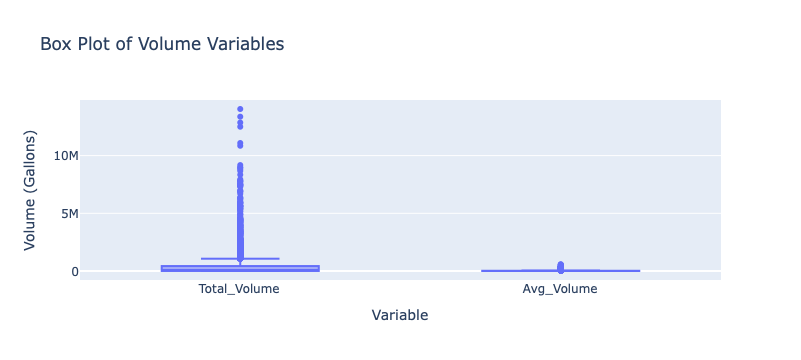

In [73]:
import plotly.express as px  

# Select relevant columns
cols = ["Total_Volume", "Avg_Volume"]
df_melted = df.melt(value_vars=cols, var_name="Volume Type", value_name="Volume")

# Create box plot
fig = px.box(df_melted, x="Volume Type", y="Volume",  
             title="Box Plot of Volume Variables",
             labels={"Volume": "Volume (Gallons)", "Volume Type": "Variable"})  

fig.show()

In [74]:
import pandas as pd
from openpyxl import load_workbook
from openpyxl.styles import PatternFill

# Define columns that need outlier detection & coloring
outlier_columns = [
    "TotalDepth", "PlugBackTotalDepth", "InjTopDepth", "InjBotDepth", 
    "PackerDepth", "Total_Volume", "Avg_Volume", "Avg_PSI"
]

# Compute IQR (Interquartile Range) for outlier columns
Q1 = df[outlier_columns].quantile(0.25)
Q3 = df[outlier_columns].quantile(0.75)
IQR = Q3 - Q1

# Define the outlier bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outlier rows
outlier_mask = (df[outlier_columns] < lower_bound) | (df[outlier_columns] > upper_bound)

# Select entire rows where at least one outlier exists (but keep all columns)
outliers_df = df[outlier_mask.any(axis=1)]

# Save full DataFrame (with all columns) to Excel
file_name = "outliers.xlsx"
outliers_df.to_excel(file_name, index=False)

# Count outliers for each column
outlier_counts = outlier_mask.sum()

# Print outlier counts
print("Outlier counts per column:")
print(outlier_counts)

# Load workbook for formatting
wb = load_workbook(file_name)
ws = wb.active

# Define unique colors for each outlier column
color_map = {
    "TotalDepth": PatternFill(start_color="FFDDC1", end_color="FFDDC1", fill_type="solid"),  # Light Orange
    "PlugBackTotalDepth": PatternFill(start_color="C1E1FF", end_color="C1E1FF", fill_type="solid"),  # Light Blue
    "InjTopDepth": PatternFill(start_color="C1FFC1", end_color="C1FFC1", fill_type="solid"),  # Light Green
    "InjBotDepth": PatternFill(start_color="FFC1C1", end_color="FFC1C1", fill_type="solid"),  # Light Red
    "PackerDepth": PatternFill(start_color="E1C1FF", end_color="E1C1FF", fill_type="solid"),  # Light Purple
    "Total_Volume": PatternFill(start_color="FFFFC1", end_color="FFFFC1", fill_type="solid"),  # Light Yellow
    "Avg_Volume": PatternFill(start_color="FFD700", end_color="FFD700", fill_type="solid"),  # Gold
    "Avg_PSI": PatternFill(start_color="ADFF2F", end_color="ADFF2F", fill_type="solid"),  # Green Yellow
}

# Apply color coding only to outlier columns (keeping all columns intact)
for row_idx, (_, row) in enumerate(outliers_df.iterrows(), start=2):  # Data starts at row 2
    for col_name in outlier_columns:  
        if outlier_mask.loc[row.name, col_name]:  # If this column is an outlier
            col_idx = list(df.columns).index(col_name) + 1  # Get correct column index
            ws.cell(row=row_idx, column=col_idx).fill = color_map[col_name]  # Apply color

# Add legend for colors
legend_start_row = ws.max_row + 2
ws.cell(row=legend_start_row, column=1, value="Outlier Legend")

for idx, (col_name, fill_style) in enumerate(color_map.items(), start=legend_start_row + 1):
    ws.cell(row=idx, column=1, value=col_name)
    ws.cell(row=idx, column=2).fill = fill_style  # Apply color fill

# Save the formatted Excel file
wb.save(file_name)

print("Outliers saved to 'outliers.xlsx' with correct column colors.")
df.shape

Outlier counts per column:
TotalDepth            173
PlugBackTotalDepth    181
InjTopDepth           267
InjBotDepth           189
PackerDepth           278
Total_Volume          582
Avg_Volume            556
Avg_PSI               416
dtype: int64
Outliers saved to 'outliers.xlsx' with correct column colors.


(6489, 17)

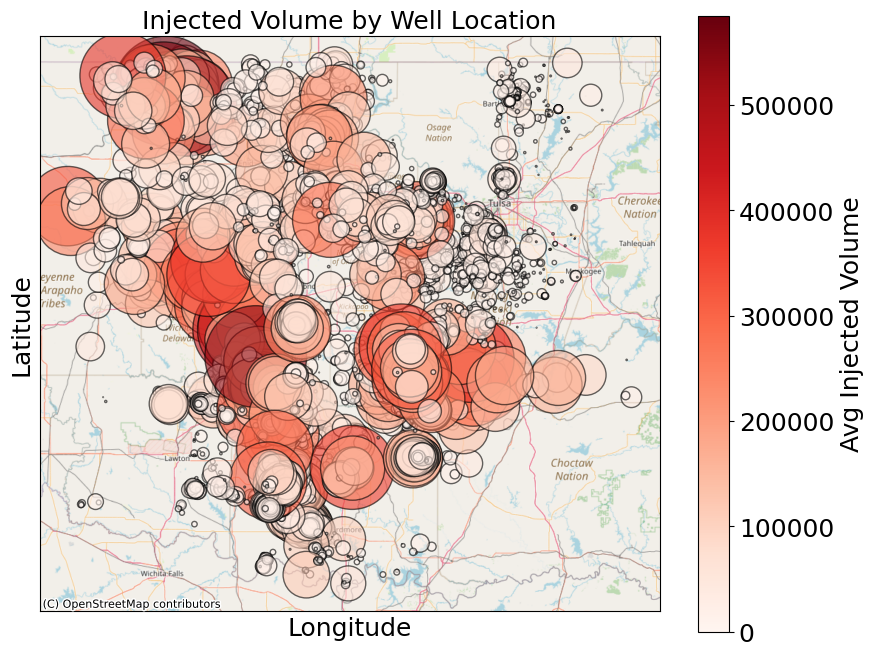

In [80]:
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd
import contextily as ctx

# Create geometry
df["geometry"] = df.apply(lambda row: Point(row["LON"], row["LAT"]), axis=1)
gdf = gpd.GeoDataFrame(df, geometry="geometry", crs="EPSG:4326")

# Convert to Web Mercator
gdf = gdf.to_crs(epsg=3857)

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf.plot(
    ax=ax,
    markersize=gdf["Avg_Volume"] / 100,
    alpha=0.6,
    column="Avg_Volume",
    cmap="Reds",
    edgecolor="black",
    legend=True,
    legend_kwds={'label': "Avg Injected Volume"}  # Removed fontsize here
)

# Add basemap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Title and axis settings
plt.title("Injected Volume by Well Location", fontsize=18)
plt.xlabel("Longitude", fontsize=18)
plt.ylabel("Latitude", fontsize=18)
plt.xticks([])
plt.yticks([])

# Update colorbar font size
cbar_ax = ax.get_figure().axes[-1]  # Get colorbar axis
cbar_ax.tick_params(labelsize=18)
cbar_ax.set_ylabel("Avg Injected Volume", fontsize=18)

# Save and show
plt.savefig('Injected Volume by well.png', dpi=300, bbox_inches='tight')
plt.show()

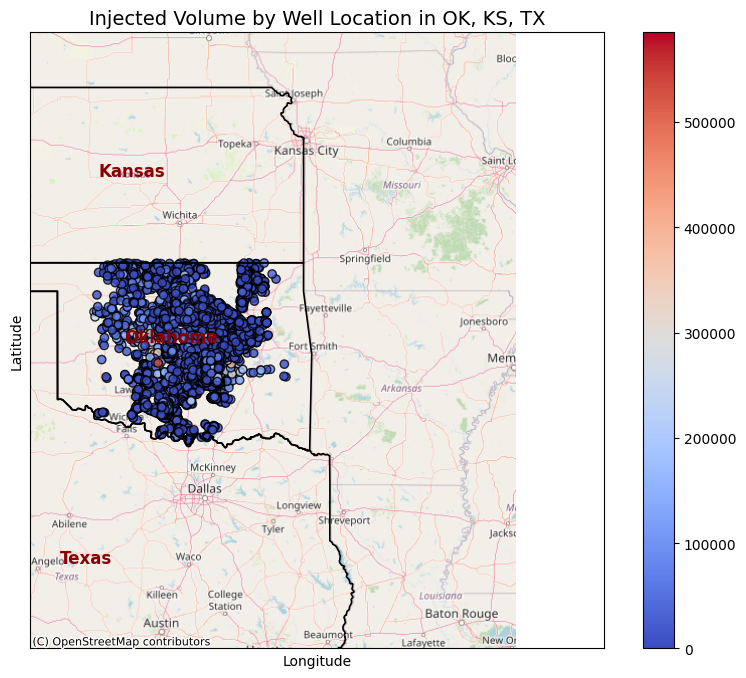

In [170]:
df["geometry"] = df.apply(lambda row: Point(row["LON"], row["LAT"]), axis=1)
gdf = gpd.GeoDataFrame(df, geometry="geometry", crs="EPSG:4326")  # WGS84 CRS
gdf = gdf.to_crs(epsg=3857)  # Convert to Web Mercator

# Load U.S. State Boundaries using geodatasets
# states = gpd.read_file(geodatasets.get_path("naturalearth.land"))
# states = states.to_crs(epsg=3857)


# Load the Natural Earth "Admin 1 - States, Provinces" shapefile (after downloading)
states = gpd.read_file("ne_10m_admin_1_states_provinces.shp")

# Filter for the required states
selected_states = states[states["name"].isin(["Oklahoma", "Kansas", "Texas"])]

# Convert to Web Mercator for compatibility
selected_states = selected_states.to_crs(epsg=3857)


# Create the plot
fig, ax = plt.subplots(figsize=(10, 8))

# Plot state boundaries
selected_states.boundary.plot(ax=ax, color="black", linewidth=1.2)

#Plot well locations with color-based injection volume representation
gdf.plot(
    ax=ax, 
    column="Avg_Volume",  
    cmap="coolwarm",  
    alpha=0.8,  
    edgecolor="black", 
    legend=True
)

# Add Basemap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Set Map Extent (Focus on OK, KS, NM, TX)
ax.set_xlim(-11200000, -9800000)  
ax.set_ylim(3500000, 5000000)     

# Add State Labels
for idx, row in selected_states.iterrows():
    plt.text(row.geometry.centroid.x, row.geometry.centroid.y, row["name"], 
             fontsize=12, fontweight="bold", ha="center", color="darkred")

# Customize Plot
plt.title("Injected Volume by Well Location in OK, KS, TX", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.xticks([])
plt.yticks([])

# Show the plot
plt.show()

In [171]:
import plotly.graph_objects as go
import geopandas as gpd
from shapely.geometry import Point

# Load the shapefile and filter for the selected states
states = gpd.read_file("ne_10m_admin_1_states_provinces.shp")
selected_states = states[states["name"].isin(["Oklahoma", "Kansas", "Texas"])]
selected_states = selected_states.to_crs(epsg=3857)  # Convert to Web Mercator

# Convert your DataFrame to a GeoDataFrame
df["geometry"] = df.apply(lambda row: Point(row["LON"], row["LAT"]), axis=1)
gdf = gpd.GeoDataFrame(df, geometry="geometry", crs="EPSG:4326")  # WGS84 CRS
gdf = gdf.to_crs(epsg=3857)  # Convert to Web Mercator

# Create a Plotly map
fig = go.Figure()

# Plot state boundaries
for _, state in selected_states.iterrows():
    if state['geometry'].geom_type == 'Polygon':
        # Single Polygon
        lon, lat = state['geometry'].exterior.coords.xy
        fig.add_trace(go.Scattermapbox(
            lat=list(lat),  # Convert to list
            lon=list(lon),  # Convert to list
            mode='lines',
            line={'color': 'black', 'width': 2},
            fill='toself'
        ))
    elif state['geometry'].geom_type == 'MultiPolygon':
        # Multiple Polygons (iterate over each Polygon in the MultiPolygon)
        for polygon in state['geometry'].geoms:
            lon, lat = polygon.exterior.coords.xy
            fig.add_trace(go.Scattermapbox(
                lat=list(lat),  # Convert to list
                lon=list(lon),  # Convert to list
                mode='lines',
                line={'color': 'black', 'width': 2},
                fill='toself'
            ))

fig.add_trace(go.Scattermapbox(
    lat=gdf['LAT'], 
    lon=gdf['LON'],
    mode='markers',
    marker=dict(
        color=gdf['Avg_Volume'],
        colorscale='Viridis',  # Using a valid colorscale
        size=8,
        opacity=0.8,
        colorbar=dict(title="Avg Volume")
    ),
    text=gdf['Avg_Volume'],  # Tooltip text
))

# Set up the layout
fig.update_layout(
    mapbox_style="open-street-map",
    mapbox=dict(
        center=dict(lat=38, lon=-97),
        zoom=5,
    ),
    title="Injected Volume by Well Location in OK, KS, TX",
    showlegend=False,
)

# Save the interactive map as an HTML file
output_file = "interactive_map.html"
fig.write_html(output_file)

# Provide a link to open the map in a browser
print(f"Interactive map has been saved. Open the map by clicking on the link below:")
print(f"file://{output_file}")

Interactive map has been saved. Open the map by clicking on the link below:
file://interactive_map.html


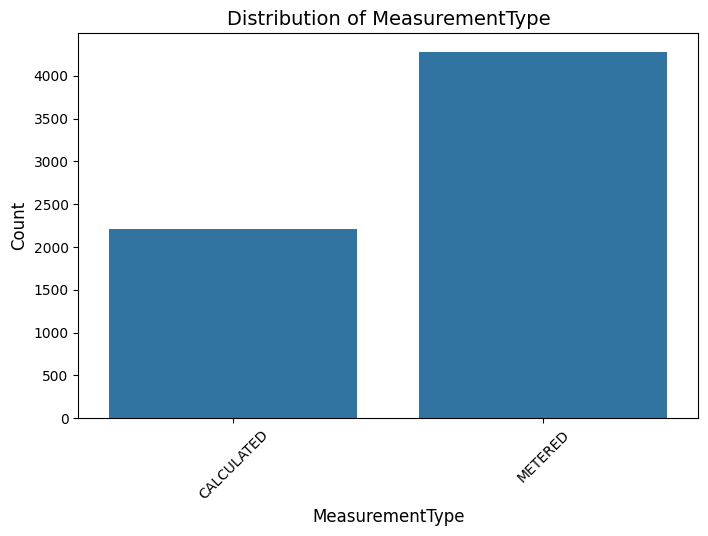

In [172]:
# Plot the barplot for MeasurementType counts
plt.figure(figsize=(8, 5))
sns.countplot(data=df, x="MeasurementType")

# Customize plot
plt.title("Distribution of MeasurementType", fontsize=14)
plt.xlabel("MeasurementType", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(rotation=45)
plt.show()

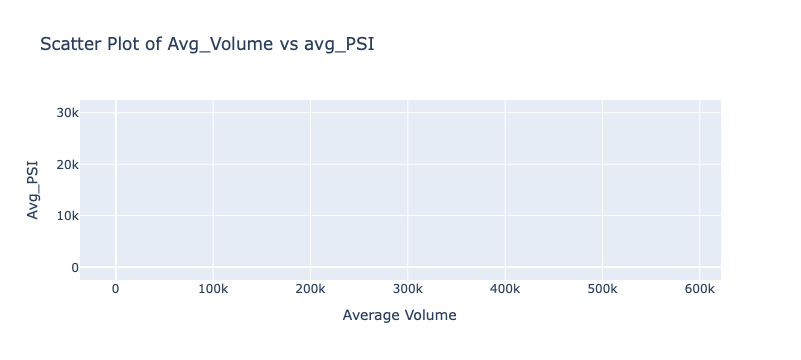

(6489, 18)

In [174]:
fig = px.scatter(df, x="Avg_Volume", y="Avg_PSI", 
                 title="Scatter Plot of Avg_Volume vs avg_PSI",
                 labels={"Avg_Volume": "Average Volume", "avg_PSI": "Average PSI"},
                 trendline="ols")  
fig.show()
df.shape

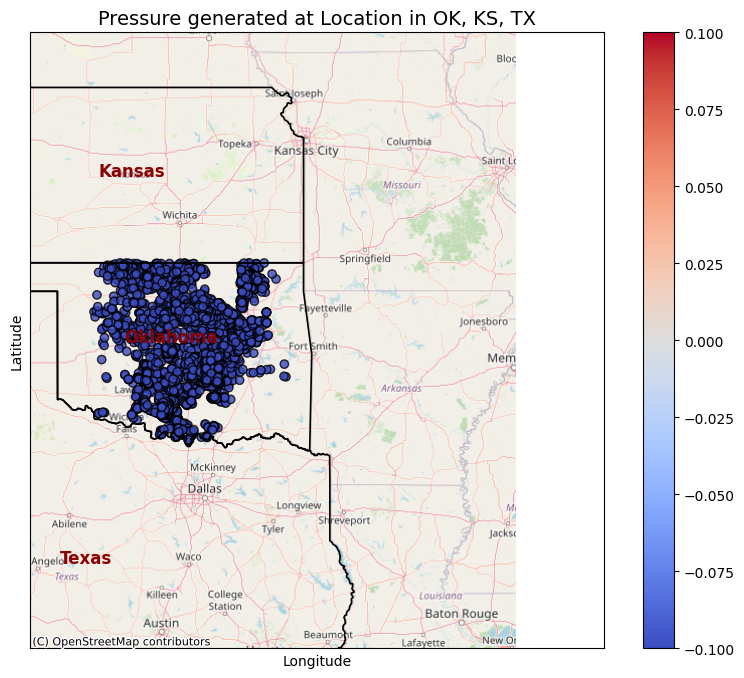

In [175]:
df["geometry"] = df.apply(lambda row: Point(row["LON"], row["LAT"]), axis=1)
gdf = gpd.GeoDataFrame(df, geometry="geometry", crs="EPSG:4326")  # WGS84 CRS
gdf = gdf.to_crs(epsg=3857)  # Convert to Web Mercator


# Load the Natural Earth "Admin 1 - States, Provinces" shapefile (after downloading)
states = gpd.read_file("ne_10m_admin_1_states_provinces.shp")

# Filter for the required states
selected_states = states[states["name"].isin(["Oklahoma", "Kansas", "Texas"])]

# Convert to Web Mercator for compatibility
selected_states = selected_states.to_crs(epsg=3857)


# Create the plot
fig, ax = plt.subplots(figsize=(10, 8))

# Plot state boundaries
selected_states.boundary.plot(ax=ax, color="black", linewidth=1.2)

#Plot well locations with color-based injection volume representation
gdf.plot(
    ax=ax, 
    column="Avg_PSI",  
    cmap="coolwarm",  
    alpha=0.8,  
    edgecolor="black", 
    legend=True
)

# Add Basemap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Set Map Extent (Focus on OK, KS, NM, TX)
ax.set_xlim(-11200000, -9800000)  
ax.set_ylim(3500000, 5000000)     

# Add State Labels
for idx, row in selected_states.iterrows():
    plt.text(row.geometry.centroid.x, row.geometry.centroid.y, row["name"], 
             fontsize=12, fontweight="bold", ha="center", color="darkred")

# Customize Plot
plt.title("Pressure generated at Location in OK, KS, TX", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.xticks([])
plt.yticks([])

# Show the plot
plt.show()

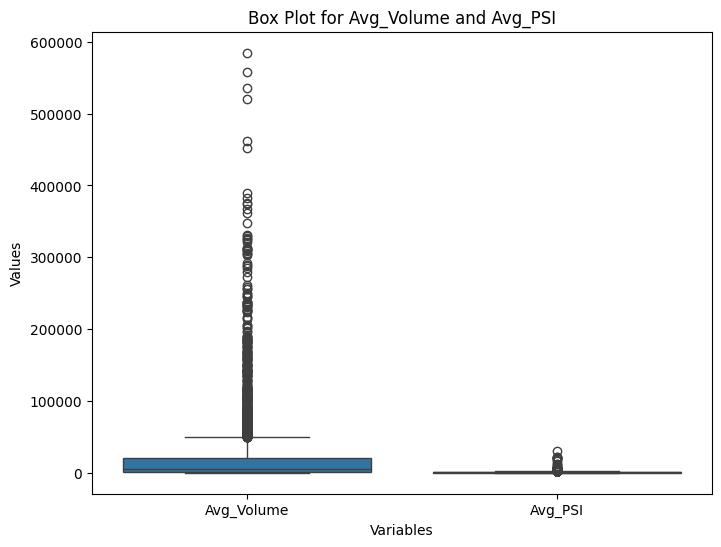

In [176]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select columns for box plot
columns = ['Avg_Volume', 'Avg_PSI']

# Create the box plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=df[columns])

# Set labels and title
plt.xlabel("Variables")
plt.ylabel("Values")
plt.title("Box Plot for Avg_Volume and Avg_PSI")

# Show the plot
plt.show()

In [177]:
# List of columns to check for outliers
columns = ['Avg_Volume', 'Avg_PSI']

# Dictionary to store outlier counts
outlier_counts = {}

for col in columns:
    # Compute Q1, Q3, and IQR
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    # Compute upper bound
    upper_bound = Q3 + 1.5 * IQR

    # Count values above the upper bound
    count_outliers = (df[col] > upper_bound).sum()
    
    # Store result
    outlier_counts[col] = count_outliers

# Display the number of outliers for each column
print(outlier_counts)

{'Avg_Volume': np.int64(556), 'Avg_PSI': np.int64(415)}


In [179]:
df = df[(df["Avg_PSI"] > 0) & (df["Avg_PSI"] <= 200)]
df.shape

(1116, 18)

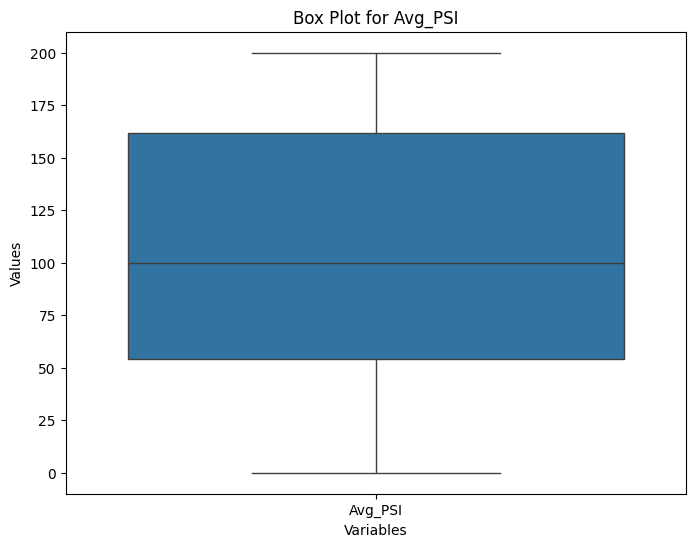

In [85]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select columns for box plot
columns = ['Avg_PSI']

# Create the box plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=df[columns])

# Set labels and title
plt.xlabel("Variables")
plt.ylabel("Values")
plt.title("Box Plot for Avg_PSI")

# Show the plot
plt.show()

In [86]:
# List of columns to check for outliers
columns = ['Avg_Volume']

for col in columns:
    # Compute Q1, Q3, and IQR
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    # Define lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Remove outliers for each column
    df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

In [87]:
import numpy as np

df = df.replace([np.inf, -np.inf], np.nan)  # Replace infinite values with NaN
df = df.dropna(subset=["Avg_Volume", "Avg_PSI"])  # Drop NaN values in target columns

In [88]:
for col in columns:
    # Compute bounds again
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Count outliers, ignoring minor floating-point errors
    count_outliers_lower = (~np.isclose(df[col], lower_bound) & (df[col] < lower_bound)).sum()
    count_outliers_upper = (~np.isclose(df[col], upper_bound) & (df[col] > upper_bound)).sum()
    
    # Print remaining outliers
    print(f"{col} -> Lower Outliers: {count_outliers_lower}, Upper Outliers: {count_outliers_upper}")

Avg_Volume -> Lower Outliers: 0, Upper Outliers: 62


In [89]:
# Calculate IQR
Q1 = df["Avg_Volume"].quantile(0.25)
Q3 = df["Avg_Volume"].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Remove outliers
df = df[(df["Avg_Volume"] >= lower_bound) & (df["Avg_Volume"] <= upper_bound)]

In [90]:
# List of columns to check for outliers
columns = ['Avg_Volume', 'Avg_PSI']

# Dictionary to store outlier counts
outlier_counts = {}

for col in columns:
    # Compute Q1, Q3, and IQR
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    # Compute upper bound
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Count values above the upper bound
    count_outliers_lower = (df[col] < lower_bound).sum()

    count_outliers_Upper = (df[col] > upper_bound).sum()
    
    # Store result
    outlier_counts[col] = count_outliers_lower+count_outliers_Upper

# Display the number of outliers for each column
print(outlier_counts)

{'Avg_Volume': np.int64(60), 'Avg_PSI': np.int64(0)}


In [91]:
df["Avg_Volume"] = pd.to_numeric(df["Avg_Volume"], errors="coerce")
Q1 = df["Avg_Volume"].quantile(0.25)
Q3 = df["Avg_Volume"].quantile(0.75)
IQR = Q3 - Q1
upper_bound = Q3 + 1.5 * IQR

print("Values beyond upper bound before removal:")
print(df[df["Avg_Volume"] > upper_bound]["Avg_Volume"].unique())  # Unique outlier values

df = df.loc[df["Avg_Volume"] <= upper_bound]

df["Avg_Volume"] = df["Avg_Volume"].astype(str).str.replace(",", "").astype(float)
df = df[(df["Avg_Volume"] < upper_bound) | np.isclose(df["Avg_Volume"], upper_bound)]
print("Remaining outliers in Avg_Volume:")
print(df[df["Avg_Volume"] > upper_bound]["Avg_Volume"].unique())  
df.shape

Values beyond upper bound before removal:
[25659.70833333 24116.08333333 28076.33333333 28674.5
 27157.875      28846.375      28549.20833333 27666.91666667
 28126.75       27332.41666667 26889.25       23915.54166667
 24806.83333333 28129.79166667 28961.95833333 26213.95833333
 25508.58333333 24969.16666667 25722.375      24664.04166667
 26143.5        24142.79166667 28980.20833333 28429.75
 25241.66666667 30000.         28854.83333333 25464.85714286
 29454.91666667 27135.83333333 27790.16666667 25086.11764706
 28688.875      27756.83333333 25689.         26182.16666667
 25952.58333333 25210.70833333 25761.         26805.09090909
 29930.375      26598.         25987.5        26871.27777778
 28815.16666667 29505.29166667 26699.79166667 28249.08333333
 27881.33333333 24185.92857143 29734.375      29728.5
 24681.28571429 25935.57142857 26462.5        26584.16666667
 26149.38888889 28467.16666667 25205.73913043 24600.        ]
Remaining outliers in Avg_Volume:
[]


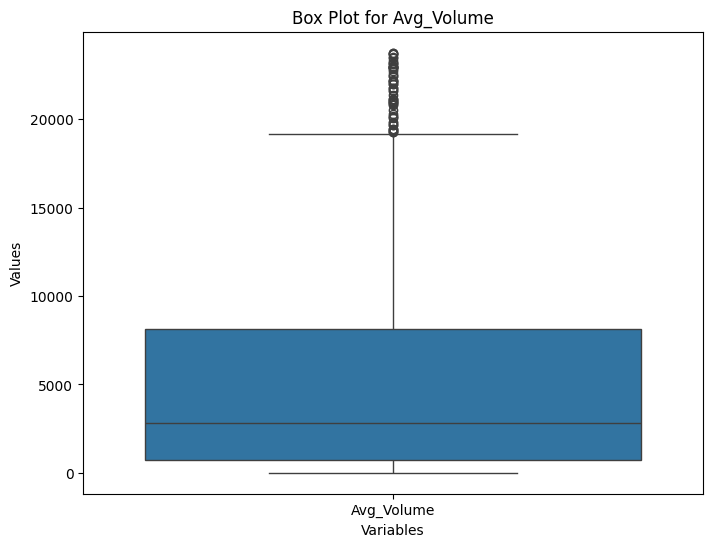

In [92]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select columns for box plot
columns = ['Avg_Volume']

# Create the box plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=df[columns])

# Set labels and title
plt.xlabel("Variables")
plt.ylabel("Values")
plt.title("Box Plot for Avg_Volume")

# Show the plot
plt.show()

In [93]:
import pandas as pd
from openpyxl import load_workbook
from openpyxl.styles import PatternFill

# Define columns that need outlier detection & coloring
outlier_columns = [
    "TotalDepth", "PlugBackTotalDepth", "InjTopDepth", "InjBotDepth", 
    "PackerDepth", "Total_Volume", "Avg_Volume", "Avg_PSI"
]

# Compute IQR (Interquartile Range) for outlier columns
Q1 = df[outlier_columns].quantile(0.25)
Q3 = df[outlier_columns].quantile(0.75)
IQR = Q3 - Q1

# Define the outlier bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outlier rows
outlier_mask = (df[outlier_columns] < lower_bound) | (df[outlier_columns] > upper_bound)

# Select entire rows where at least one outlier exists (but keep all columns)
outliers_df = df[outlier_mask.any(axis=1)]

# Save full DataFrame (with all columns) to Excel
file_name = "outliers_1.xlsx"
outliers_df.to_excel(file_name, index=False)

# Count outliers for each column
outlier_counts_1 = outlier_mask.sum()

# Print outlier counts
print("Outlier counts per column:")
print(outlier_counts_1)

# Load workbook for formatting
wb = load_workbook(file_name)
ws = wb.active

# Define unique colors for each outlier column
color_map = {
    "TotalDepth": PatternFill(start_color="FFDDC1", end_color="FFDDC1", fill_type="solid"),  # Light Orange
    "PlugBackTotalDepth": PatternFill(start_color="C1E1FF", end_color="C1E1FF", fill_type="solid"),  # Light Blue
    "InjTopDepth": PatternFill(start_color="C1FFC1", end_color="C1FFC1", fill_type="solid"),  # Light Green
    "InjBotDepth": PatternFill(start_color="FFC1C1", end_color="FFC1C1", fill_type="solid"),  # Light Red
    "PackerDepth": PatternFill(start_color="E1C1FF", end_color="E1C1FF", fill_type="solid"),  # Light Purple
    "Total_Volume": PatternFill(start_color="FFFFC1", end_color="FFFFC1", fill_type="solid"),  # Light Yellow
    "Avg_Volume": PatternFill(start_color="FFD700", end_color="FFD700", fill_type="solid"),  # Gold
    "Avg_PSI": PatternFill(start_color="ADFF2F", end_color="ADFF2F", fill_type="solid"),  # Green Yellow
}

# Apply color coding only to outlier columns (keeping all columns intact)
for row_idx, (_, row) in enumerate(outliers_df.iterrows(), start=2):  # Data starts at row 2
    for col_name in outlier_columns:  
        if outlier_mask.loc[row.name, col_name]:  # If this column is an outlier
            col_idx = list(df.columns).index(col_name) + 1  # Get correct column index
            ws.cell(row=row_idx, column=col_idx).fill = color_map[col_name]  # Apply color

# Add legend for colors
legend_start_row = ws.max_row + 2
ws.cell(row=legend_start_row, column=1, value="Outlier Legend")

for idx, (col_name, fill_style) in enumerate(color_map.items(), start=legend_start_row + 1):
    ws.cell(row=idx, column=1, value=col_name)
    ws.cell(row=idx, column=2).fill = fill_style  # Apply color fill

# Save the formatted Excel file
wb.save(file_name)

print("Outliers saved to 'outliers_1.xlsx' with correct column colors.")

Outlier counts per column:
TotalDepth            49
PlugBackTotalDepth    48
InjTopDepth           47
InjBotDepth           52
PackerDepth           47
Total_Volume          58
Avg_Volume            56
Avg_PSI                0
dtype: int64
Outliers saved to 'outliers_1.xlsx' with correct column colors.


In [94]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 904 entries, 0 to 10110
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   API                  904 non-null    int64  
 1   LAT                  904 non-null    float64
 2   LON                  904 non-null    float64
 3   Status               904 non-null    object 
 4   TotalDepth           904 non-null    float64
 5   PlugBackTotalDepth   904 non-null    float64
 6   InjTopDepth          904 non-null    float64
 7   InjBotDepth          904 non-null    float64
 8   MeasurementType      904 non-null    object 
 9   FluidType            904 non-null    object 
 10  Packer               904 non-null    object 
 11  PackerDepth          904 non-null    float64
 12  PermitFormationName  904 non-null    object 
 13  County               904 non-null    object 
 14  Total_Volume         904 non-null    float64
 15  Avg_Volume           904 non-null    float6

In [95]:
df.columns

Index(['API', 'LAT', 'LON', 'Status', 'TotalDepth', 'PlugBackTotalDepth',
       'InjTopDepth', 'InjBotDepth', 'MeasurementType', 'FluidType', 'Packer',
       'PackerDepth', 'PermitFormationName', 'County', 'Total_Volume',
       'Avg_Volume', 'Avg_PSI', 'geometry'],
      dtype='object')

In [96]:
df_well = df

# Save to an Excel file if needed
df_well.to_excel("df_well.xlsx", index=False)

In [98]:
df_well.shape

(904, 18)